In [6]:
# 1. Load and visualize the data
# 2. Define a Neural Network
# 3. Train the model
# 4. Evaluate the performance of the trained model on a test dataset



In [7]:
#Importing the necessary libraries to deal with pytorch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [17]:
import torch
import torch.nn.functional as tf
from torch import nn
from torch import optim
from torchvision import datasets, transforms, models


In [9]:
#Defining the transform to normalize the data
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5),(0.5),)])


In [10]:
#choosing the training dataset
trainset = datasets.MNIST(root='data', download = True, train= True, transform= transform)
#preparting the dataloader(train)
trainloader=torch.utils.data.DataLoader(trainset, batch_size = 20, shuffle= True, num_workers= 0)
#choosing the testing dataset
testset = datasets.MNIST(root='data', download = True, train= False, transform= transform)
#preparing the dataloader(test)
testloader=torch.utils.data.DataLoader(testset, batch_size = 20, shuffle= True, num_workers= 0)



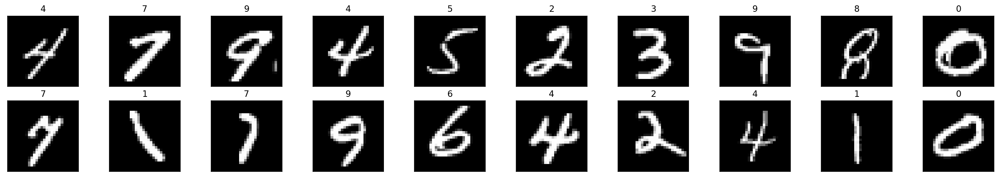

In [33]:
###visualizing a batch of training data
#obtaining a batch of the training data
image, label = next(iter(trainloader))
image= image.numpy()


#plot the images in the batch with their corresponding labels
%matplotlib inline
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(20):
    ax = fig.add_subplot(2, int(20/2), idx+1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(image[idx]), cmap='gray')
    # print out the correct label for each image
    # .item() gets the value contained in a Tensor
    ax.set_title(str(label[idx].item()))



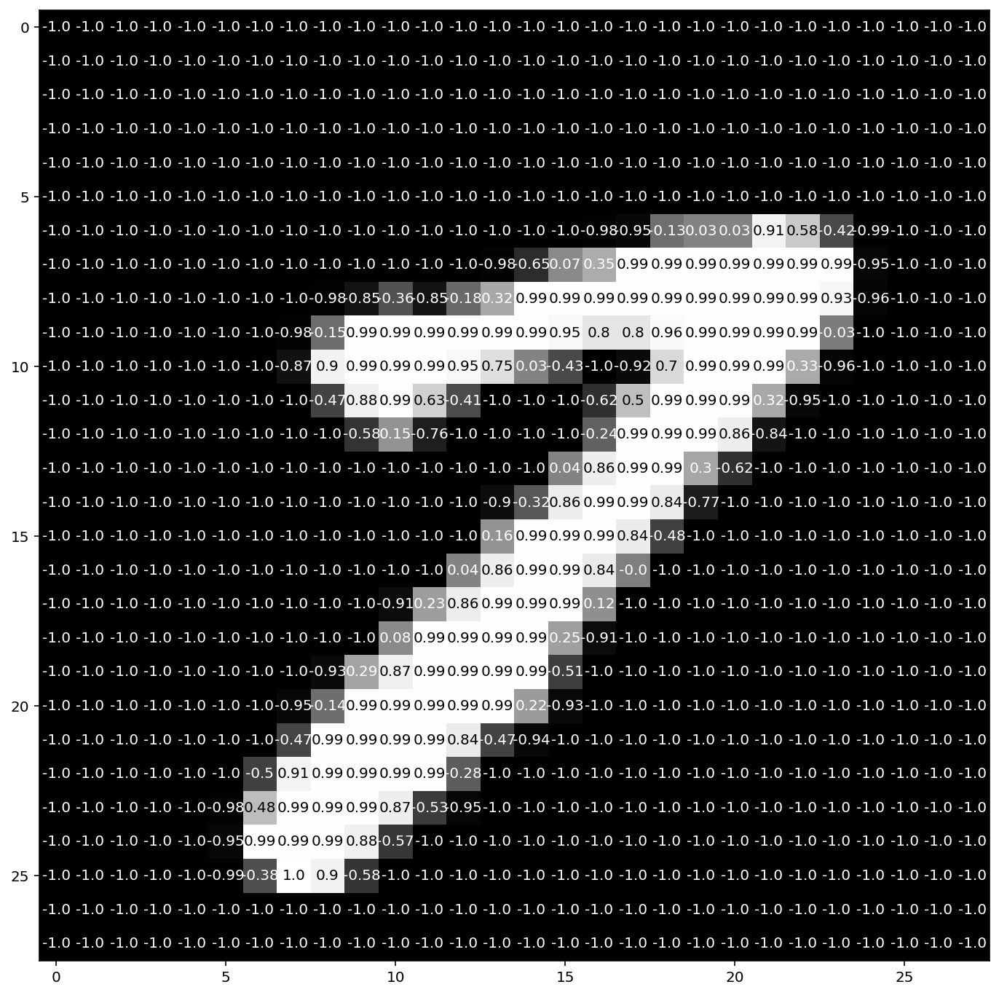

In [34]:
#viewing an image in more detail

img = np.squeeze(image[1])

fig = plt.figure(figsize = (12,12)) 
ax = fig.add_subplot(111)
ax.imshow(img, cmap='gray')
width, height = img.shape
thresh = img.max()/2.5
for x in range(width):
    for y in range(height):
        val = round(img[x][y],2) if img[x][y] !=0 else 0
        ax.annotate(str(val), xy=(y,x),
                    horizontalalignment='center',
                    verticalalignment='center',
                    color='white' if img[x][y]<thresh else 'black')

In [13]:
#Defining the Network Architecture
class Classifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(28*28,512)
        self.fc2 = nn.Linear(512,512)
        self.fc3 = nn.Linear(512,10) #10 corresponds to the number of digit classes 0 to 9. So, this layer will 
        #produce a class score
        
        # dropout prevents overfitting of data.
        #Dropout is a regularization technique that prevents neural networks from overfitting. 
        #Regularization methods like L1 and L2 reduce overfitting by modifying the cost function. 
        #Dropout on the other hand, modify the network itself. 
        #It randomly drops neurons from the neural network during training in each iteration
        
        self.dropout = nn.Dropout(p=0.2)

    def forward(self,x):
        #here x is a gray scale vector
        
        x = x.view(-1,28*28) #view(rows,columns) here the output will be a vector of 28*28 values. -1 will 
        #automatically fit all of the x values into the provided column's shape

        x= self.dropout(tf.relu(self.fc1(x)))
        x = self.dropout(tf.relu(self.fc2(x)))
        #x= tf.log_softmax(self.fc3(x))
        x = self.fc3(x) # we will be using CrossEntropyLoss 
        
        return x #this x should represent our 10 (0 to 9 )class scores
    
#PyTorch's cross entropy function applies a softmax funtion to the output layer and then calculates the log loss.
    

In [14]:
initial_epoch = 0

In [18]:

checkpoint = torch.load('model_checkpoint.pth')
model = Classifier()
model.load_state_dict(checkpoint['state_dict'])
initial_epoch = checkpoint['epoch_no']

#Specify loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)


In [1]:
# training the network

# The steps for training/learning from a batch of data are described in the comments below:

# 1. Clear the gradients of all optimized variables
# 2. Forward pass: compute predicted outputs by passing inputs to the model
# 3. Calculate the loss
# 4. Backward pass: compute gradient of the loss with respect to model parameters
# 5. Perform a single optimization step (parameter update)
# 6. Update average training loss



        
    
        



In [43]:
# number of epochs to train the model
n_epochs = 1

model.train() # prep model for training

for epoch in range(n_epochs):
    # monitor training loss
    train_loss = 0.0
    
    ###################
    # train the model #
    ###################
    for data, target in trainloader:
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        #here, we call a model and perform a forward pass. Our model takes in the input images,data from train loader
        #and returns the predicted class scores, which is stored in output variable.
        output = model(data)
        print("output",output)
        print("data", data)
        print("target", target)
        # calculate the loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update running training loss
        train_loss += loss.item()*data.size(0)
             
    # print training statistics 
    # calculate average loss over an epoch
    train_loss = train_loss/len(trainloader.dataset)

    print('Epoch: {} \tTraining Loss: {:.6f}'.format(
        epoch+1, 
        train_loss
        ))





        

output tensor([[-1.2289e+01,  1.5954e+01, -4.2134e+00, -1.5717e+00,  2.6587e+00,
         -3.1615e+00, -2.8132e+00,  4.3255e+00,  1.4294e-01, -6.4626e-01],
        [-1.1245e+01,  7.7689e+00, -2.0199e+00,  3.1846e+01, -8.7159e+00,
         -5.8965e-01, -1.4207e+01, -2.3011e+00, -2.6855e+00,  2.6425e+00],
        [ 7.0514e+00, -4.8575e+00,  5.9724e+00, -7.6218e+00,  3.4736e+00,
          1.3151e+00,  2.2595e+01, -1.5271e+01,  1.1438e+00, -1.3475e+01],
        [-3.5126e+00,  3.7049e+00,  4.9118e+00,  1.0054e-01, -5.4157e+00,
         -9.2044e+00, -8.8509e+00,  1.5887e+01, -3.2184e+00,  4.6729e+00],
        [ 1.5706e+00, -6.9577e+00, -3.2998e+00, -8.3033e+00,  2.8588e-02,
          1.0443e+01,  2.3422e+01, -1.5030e+01,  3.1622e+00, -3.6650e+00],
        [ 2.5387e+01, -3.6457e+00, -2.9110e-01, -1.1523e+00, -1.4728e+01,
          2.5377e+00,  6.6957e+00,  3.8491e-01, -7.2821e+00, -6.2206e+00],
        [-1.1178e+01, -2.9088e+00, -1.3368e+01,  2.3739e+00,  7.6174e+00,
         -7.7832e+00, -1.

In [30]:
# initialize lists to monitor test loss and accuracy
test_loss = 0.0
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))

model.eval() # prep model for evaluation

for data, target in testloader:
    # forward pass: compute predicted outputs by passing inputs to the model
    output = model(data)
    # calculate the loss
    loss = criterion(output, target)
    # update test loss 
    test_loss += loss.item()*data.size(0)
    # convert output probabilities to predicted class
#Since, our model is returning a list of the class scores, to isolate the prediction, one need to take the maximum
#value among those values and return it as our prediction
    _, pred = torch.max(output, 1)
    # compare predictions to true label and creates the list whether a certain prediction was correct or not
    correct = np.squeeze(pred.eq(target.data.view_as(pred)))
    # calculate test accuracy for each object class
    #Here, the above obtained list is separated into 10 classes and accuracy is printed for each classes
    for i in range(len(target)):
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

# calculate and print avg test loss
test_loss = test_loss/len(testloader.dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

#here if our model sees a batch of 20 images during training, then the return loss will be average loss over those
#20 images
for i in range(10):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            str(i), 100 * class_correct[i] / class_total[i],
            np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))




Test Loss: 0.063443

Test Accuracy of     0: 99% (972/980)
Test Accuracy of     1: 99% (1129/1135)
Test Accuracy of     2: 99% (1022/1032)
Test Accuracy of     3: 98% (994/1010)
Test Accuracy of     4: 98% (969/982)
Test Accuracy of     5: 97% (874/892)
Test Accuracy of     6: 98% (940/958)
Test Accuracy of     7: 98% (1010/1028)
Test Accuracy of     8: 98% (955/974)
Test Accuracy of     9: 97% (983/1009)

Test Accuracy (Overall): 98% (9848/10000)


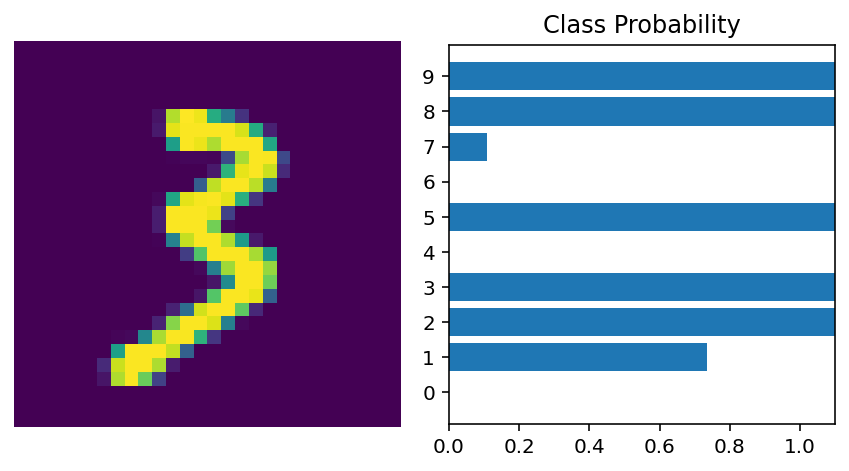

In [40]:
%matplotlib inline
%config InlineBackend.figure_format = ''

import helper

# Test out your network!

dataiter = iter(testloader)
images, labels = dataiter.next()
img = images[1]

# TODO: Calculate the class probabilities (softmax) for img
ps = torch.exp(model(img))

# Plot the image and probabilities
helper.view_classify(img, ps, version='')

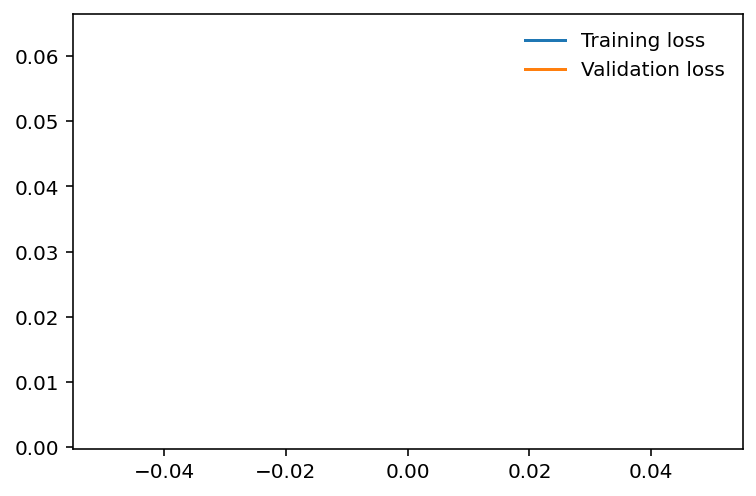

In [41]:
plt.plot(train_loss, label='Training loss')
plt.plot(test_loss, label='Validation loss')
plt.legend(frameon=False)

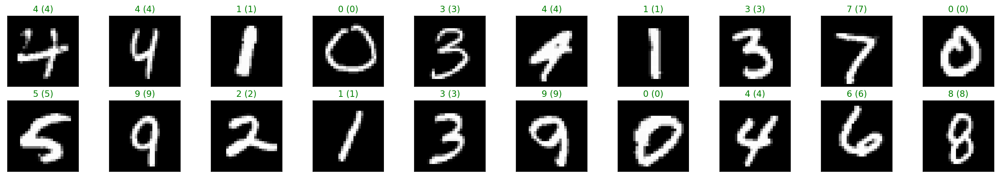

In [42]:
# obtain one batch of test images
dataiter = iter(testloader)
images, labels = dataiter.next()

# get sample outputs
output = model(images)
# convert output probabilities to predicted class
_, preds = torch.max(output, 1)
# prep images for display
images = images.numpy()

# plot the images in the batch, along with predicted and true labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(20):
    ax = fig.add_subplot(2, int(20/2), idx+1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(images[idx]), cmap='gray')
    ax.set_title("{} ({})".format(str(preds[idx].item()), str(labels[idx].item())),
                 color=("green" if preds[idx]==labels[idx] else "red"))